<a href="https://colab.research.google.com/github/rahuls0017/rahul/blob/main/Copy_of_Copy_of_instance__segmentation_tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Install

In [ ]:
!pip install -U --pre tensorflow=="2.*"
!pip install tf_slim

Make sure you have `pycocotools` installed

In [ ]:
!pip install pycocotools

Get `tensorflow/models` or `cd` to parent directory of the repository.

In [ ]:
import os
import pathlib


if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Compile protobufs and install the object_detection package

In [ ]:
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.

In [ ]:
%%bash 
cd models/research
cp /content/models/research/object_detection/packages/tf2/setup.py /content/models/research
pip install .

Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1660323 sha256=8a61788814f76eef6a4c244217c738ca7af6ae333f446a4b8a1b48fccabc8f94
  Stored in directory: /tmp/pip-ephem-wheel-cache-tjcshx2f/wheels/fa/a4/d2/e9a5057e414fd46c8e543d2706cd836d64e1fcd9eccceb2329
Successfully built object-detection
  Attempting uninstall: object-detection
    Found existing installation: object-detection 0.1
    Uninstalling object-detection-0.1:
      Successfully uninstalled object-detection-0.1


  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.


### Imports

In [ ]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display

Import the object detection module.

In [ ]:
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

Patches:

In [ ]:
# # patch tf1 into `utils.ops`
# utils_ops.tf = tf.compat.v1

# # Patch the location of gfile
# tf.gfile = tf.io.gfile

# Model preparation 

## Loader

In [ ]:
def load_model(model_name, base_url = 'http://download.tensorflow.org/models/object_detection/'):
  model_file = model_name + '.tar.gz'
  model_dir = tf.keras.utils.get_file(
    fname=model_name, 
    origin=base_url + model_file,
    untar=True)

  model_dir = pathlib.Path(model_dir)/"saved_model"

  model = tf.saved_model.load(str(model_dir))

  return model

## Loading label map








In [ ]:
# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = 'models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

For the sake of simplicity we will test on 2 images:

In [ ]:
# If you want to test the code with your images, just add path to the images to the TEST_IMAGE_PATHS.
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('models/research/object_detection/test_images')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))
TEST_IMAGE_PATHS

[PosixPath('models/research/object_detection/test_images/image1.jpg'),
 PosixPath('models/research/object_detection/test_images/image2.jpg'),
 PosixPath('models/research/object_detection/test_images/image3.jpg')]

# Detection  

Load mask rcnn model:

In [ ]:
model_name = "mask_rcnn_inception_resnet_v2_1024x1024_coco17_gpu-8"
masking_model = load_model(model_name, base_url = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/')

In [ ]:
masking_model.signatures['serving_default'].output_dtypes

{'anchors': tf.float32,
 'box_classifier_features': tf.float32,
 'class_predictions_with_background': tf.float32,
 'detection_anchor_indices': tf.float32,
 'detection_boxes': tf.float32,
 'detection_classes': tf.float32,
 'detection_masks': tf.float32,
 'detection_multiclass_scores': tf.float32,
 'detection_scores': tf.float32,
 'final_anchors': tf.float32,
 'image_shape': tf.float32,
 'mask_predictions': tf.float32,
 'num_detections': tf.float32,
 'num_proposals': tf.float32,
 'proposal_boxes': tf.float32,
 'proposal_boxes_normalized': tf.float32,
 'raw_detection_boxes': tf.float32,
 'raw_detection_scores': tf.float32,
 'refined_box_encodings': tf.float32,
 'rpn_box_encodings': tf.float32,
 'rpn_box_predictor_features': tf.float32,
 'rpn_features_to_crop': tf.float32,
 'rpn_objectness_predictions_with_background': tf.float32}

In [ ]:
masking_model.signatures['serving_default'].output_shapes

{'anchors': TensorShape([None, 4]),
 'box_classifier_features': TensorShape([300, 9, 9, 1536]),
 'class_predictions_with_background': TensorShape([300, 91]),
 'detection_anchor_indices': TensorShape([1, 100]),
 'detection_boxes': TensorShape([1, 100, 4]),
 'detection_classes': TensorShape([1, 100]),
 'detection_masks': TensorShape([1, 100, 33, 33]),
 'detection_multiclass_scores': TensorShape([1, 100, 91]),
 'detection_scores': TensorShape([1, 100]),
 'final_anchors': TensorShape([1, 300, 4]),
 'image_shape': TensorShape([4]),
 'mask_predictions': TensorShape([100, 90, 33, 33]),
 'num_detections': TensorShape([1]),
 'num_proposals': TensorShape([1]),
 'proposal_boxes': TensorShape([1, 300, 4]),
 'proposal_boxes_normalized': TensorShape([1, 300, 4]),
 'raw_detection_boxes': TensorShape([1, 300, 4]),
 'raw_detection_scores': TensorShape([1, 300, 91]),
 'refined_box_encodings': TensorShape([300, 90, 4]),
 'rpn_box_encodings': TensorShape([1, 49152, 4]),
 'rpn_box_predictor_features': Tens

Add a wrapper function to call the model, and cleanup the outputs:

In [ ]:
def run_inference_for_single_image(model, image):
  
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis, ...]
  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)
  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  need_detection_key = ['detection_classes','detection_boxes','detection_masks','detection_scores']
  output_dict = {key: output_dict[key][0, :num_detections].numpy()
                for key in need_detection_key}
  output_dict['num_detections'] = num_detections
  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
  # Handle models with masks:
  if 'detection_masks' in output_dict:
      # Reframe the the bbox mask to the image size.
      detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
          tf.convert_to_tensor(output_dict['detection_masks']), output_dict['detection_boxes'],
          image.shape[0], image.shape[1])
      detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                        tf.uint8)
      output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()

  return output_dict

Run it on each test image and show the results:

In [ ]:
def show_inference(model, image_path):
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = np.array(Image.open(image_path))
  # Actual detection.
  output_dict = run_inference_for_single_image(model, image_np)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)

  display(Image.fromarray(image_np))

## Instance Segmentation

The instance segmentation model includes a `detection_masks` output:

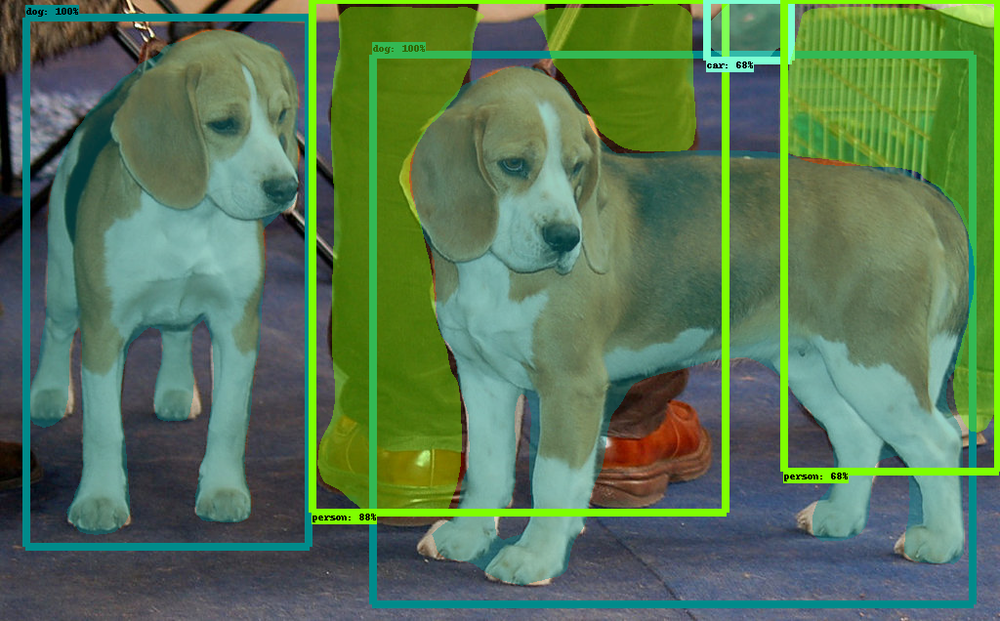

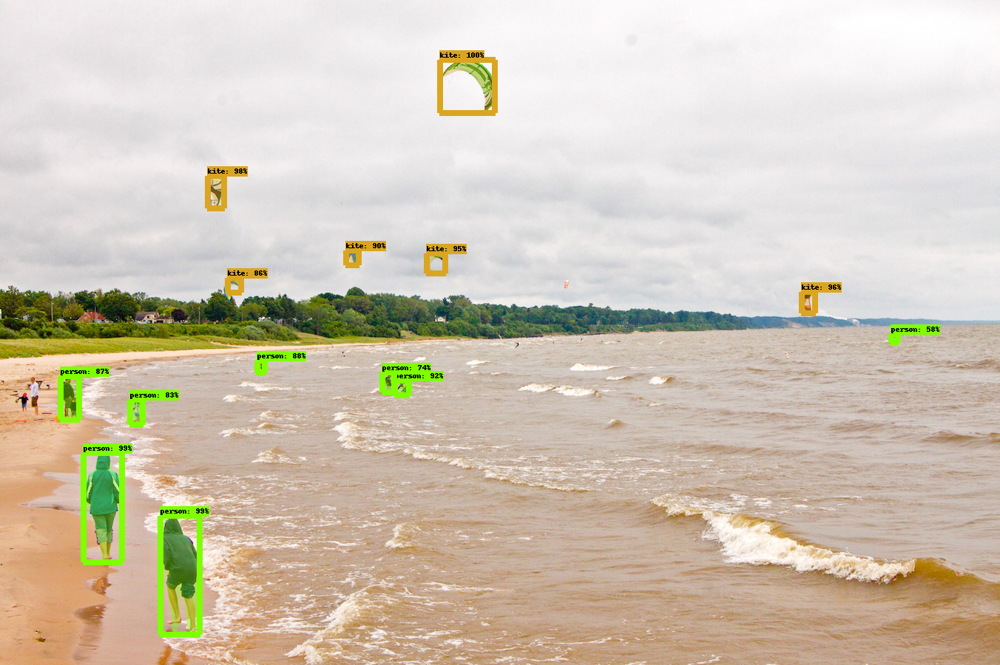

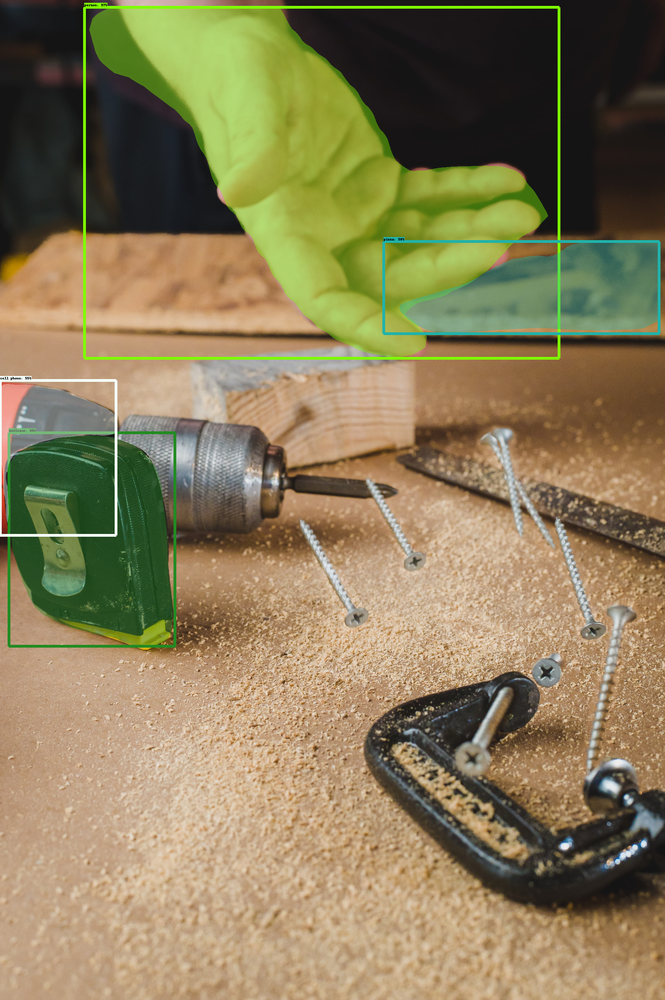

In [ ]:
for image_path in TEST_IMAGE_PATHS:
  show_inference(masking_model, image_path)